In [1]:
# importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import datetime
import time
%matplotlib inline

# setting directory and pandas max rows/cols
os.chdir("D:\EDA\machine_hack\pred house\House\House")
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
import warnings
warnings.filterwarnings('ignore')

In [2]:
# loading the dataset
house = pd.read_csv('kc_house_data.csv')


In [3]:
# print the first five rows
house.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
print("The datapoints and features in the dataset are: {}".format(house.shape))

The datapoints and features in the dataset are: (21613, 21)


21613 data points and 21 features are presented in the dataset 

In [5]:
# print the column names are:

print("The following are the column names: \n\n",house.columns)

The following are the column names: 

 Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')


In [6]:
# gives the information about the data types and Column names and Non Null counts 
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [7]:
# find the presnet age and substract the previous age then get the actual age of the house. for better predication

In [8]:
#covert unix time into date time

date_year = pd.to_datetime(house.date).dt.date
date_year.head()

0    2014-10-13
1    2014-12-09
2    2015-02-25
3    2014-12-09
4    2015-02-18
Name: date, dtype: object

In [9]:
current_year = datetime.datetime.now().year
current_year

2021

In [10]:
house["house_age"] = current_year - pd.to_datetime(house["date"]).dt.year
house.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,house_age
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,7
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,7
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,6
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,7
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,6


drop some unwanted columns

In [11]:
house.drop(['id','date','zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'] ,axis = 1, inplace=True)


In [12]:
house.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,house_age
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,7
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,7
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,6
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,7
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,6


In [13]:
house.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'house_age'],
      dtype='object')

In [14]:
#sns.pairplot(house, x_vars=house.loc[:, house.columns != 'price'],y_vars=house.price,kind = 'reg')

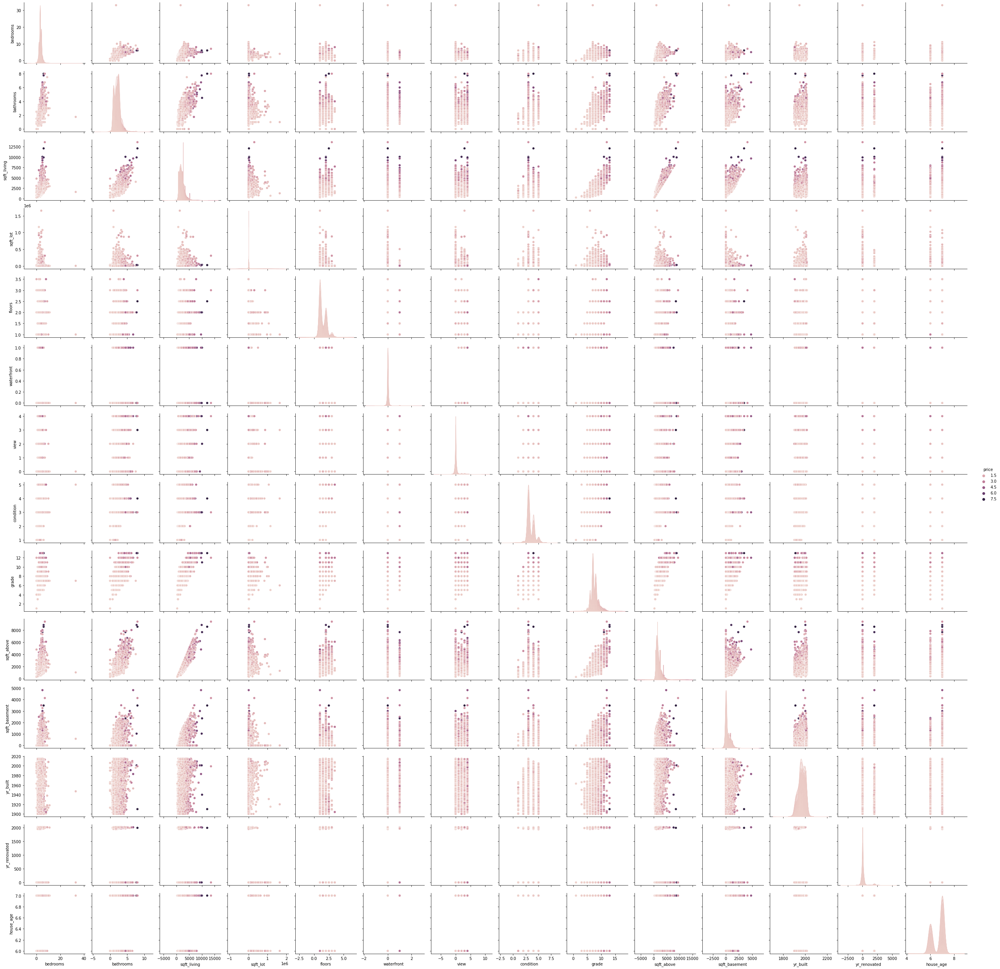

In [15]:
sns.pairplot(house,hue = 'price')

array([[<AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'bathrooms'}>,
        <AxesSubplot:title={'center':'sqft_living'}>],
       [<AxesSubplot:title={'center':'sqft_lot'}>,
        <AxesSubplot:title={'center':'floors'}>,
        <AxesSubplot:title={'center':'waterfront'}>,
        <AxesSubplot:title={'center':'view'}>],
       [<AxesSubplot:title={'center':'condition'}>,
        <AxesSubplot:title={'center':'grade'}>,
        <AxesSubplot:title={'center':'sqft_above'}>,
        <AxesSubplot:title={'center':'sqft_basement'}>],
       [<AxesSubplot:title={'center':'yr_built'}>,
        <AxesSubplot:title={'center':'yr_renovated'}>,
        <AxesSubplot:title={'center':'house_age'}>, <AxesSubplot:>]],
      dtype=object)

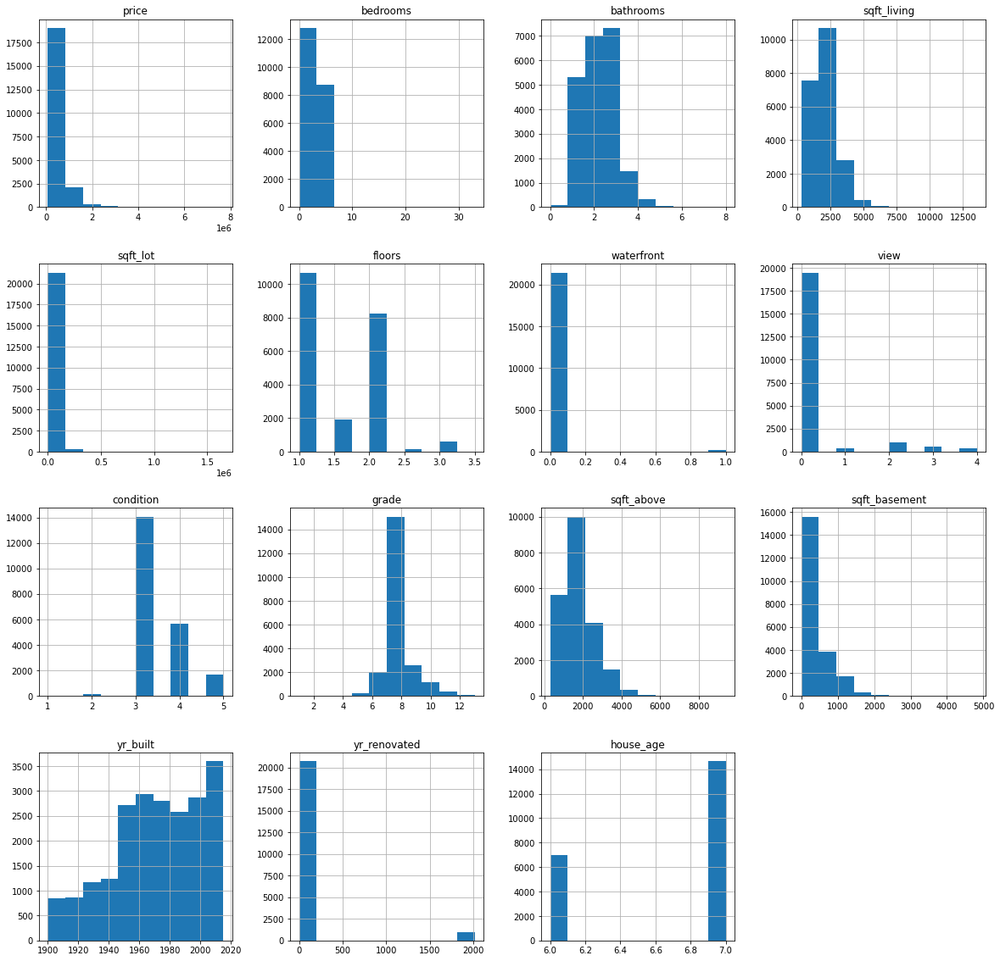

In [16]:
house.hist(figsize = (20,20))

<AxesSubplot:>

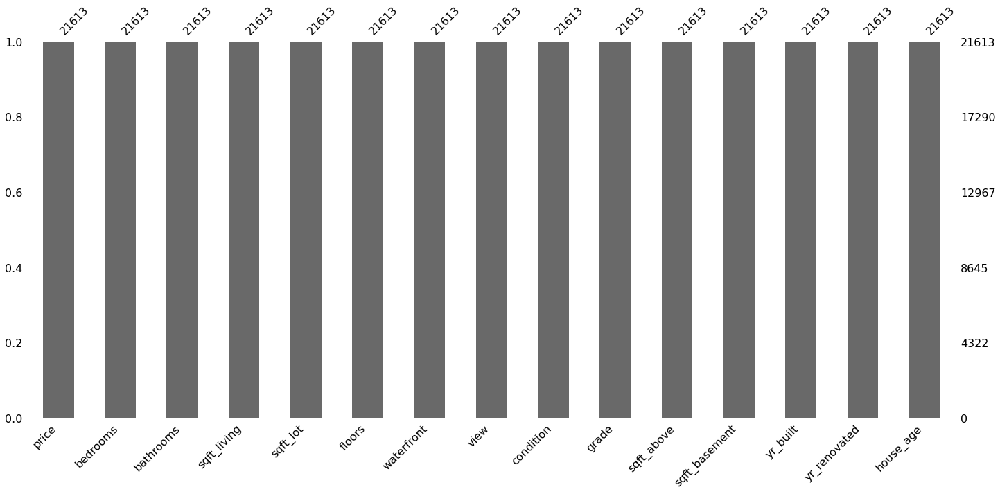

In [17]:
## null count analysis
import missingno as msno
msno.bar(house)

<AxesSubplot:>

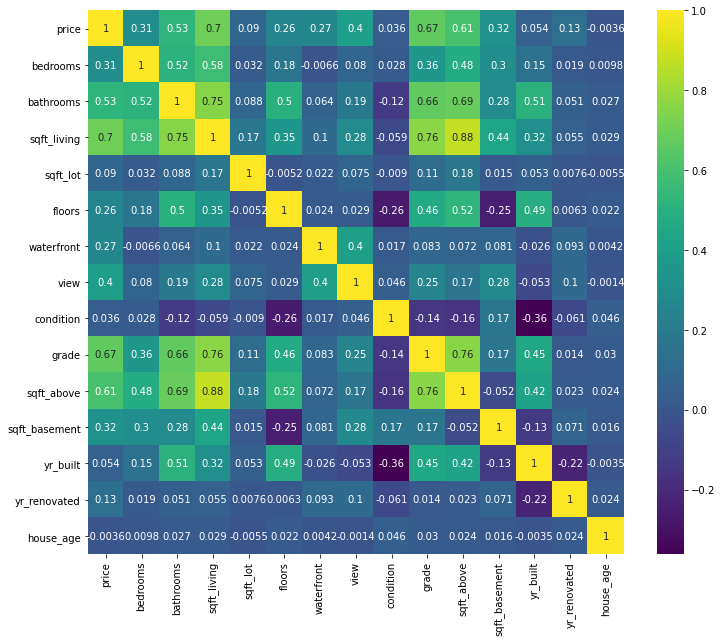

In [18]:
plt.figure(figsize=(12,10))  
sns.heatmap(house.corr(), annot=True, cmap ='viridis')  

In [19]:
house.loc[:, house.columns != 'price']

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,house_age
0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,7
1,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,7
2,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,6
3,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,7
4,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,6
5,4,4.50,5420,101930,1.0,0,0,3,11,3890,1530,2001,0,7
6,3,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,7
7,3,1.50,1060,9711,1.0,0,0,3,7,1060,0,1963,0,6
8,3,1.00,1780,7470,1.0,0,0,3,7,1050,730,1960,0,6
9,3,2.50,1890,6560,2.0,0,0,3,7,1890,0,2003,0,6


In [20]:
x=house.loc[:, house.columns != 'price']
y=house.price

In [21]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x, y, random_state=42)

In [22]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x_train, y_train)

LinearRegression()

In [23]:
accuracy = regressor.score(x_test, y_test)
"Accuracy: {}%".format(int(round(accuracy * 100)))

'Accuracy: 66%'